<h2><font color="#07bdf5">1.Import the necessary libraries</font></h2>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from scipy.stats import zscore
from sklearn.metrics import confusion_matrix


<h2><font color="#07bdf5">2.Read the data as a data frame</font></h2>

In [2]:
veh_df=pd.read_csv("./vehicle.csv")

In [3]:
veh_df.head(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204,bus
7,90,43.0,66.0,157.0,65.0,9,137.0,48.0,18.0,146,162.0,281.0,164.0,67.0,3.0,3.0,193.0,202,van
8,86,34.0,62.0,140.0,61.0,7,122.0,54.0,17.0,127,141.0,223.0,112.0,64.0,2.0,14.0,200.0,208,van
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car


<font color="07bdf5" style="font-family:courier;font-size:24px;">Observation:DataFrame loaded</font>

<h2><font color="#07bdf5">3.EDA - Exploratory Data Analytics</font></h2>

In [4]:
veh_df.shape

(846, 19)

<font color="07bdf5" style="font-family:courier;font-size:24px;">Observation:The given dataset contains 846 observation and 19 attributes</font>

In [5]:
veh_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr.axis_aspect_ratio           844 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr.axis_rectangularity         843 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance.1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration.1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about.1               845 non-null float64
skewness_about.2               845 non-null float64
hollows_ratio    

<font color="#07bdf5" style="font-family:courier;font-size:24px;">Observation:</font>
<font color="#07bdf5" style="font-family:courier;font-size:16px;">
<ul>
    <li><u>Numeric (Integer) attributes: 4 </u> compactness,max.length_aspect_ratio,max.length_rectangularity,hollows_ratio  </li>
    <li><u>Numeric (Float) attributes: 14</u> circularity
distance_circularity,
radius_ratio,
pr.axis_aspect_ratio,
scatter_ratio,
elongatedness,
pr.axis_rectangularity,
scaled_variance,
scaled_variance.1,
scaled_radius_of_gyration,
scaled_radius_of_gyration.1,
skewness_about,
skewness_about.1,
skewness_about.2</li>
    <li><u>Object attributes: 1 </u>class </li>
</ul>
    </font>

In [6]:
# Check for missing value
veh_df.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [7]:
veh_df['class'].unique()

array(['van', 'car', 'bus'], dtype=object)

<font color="07bdf5" style="font-family:courier;font-size:24px;">It is a classification problem all observations are classified into one of three classes <font color="red">'van' , 'car', <font color="07bdf5">or</font> 'bus'</font></font>

In [8]:
#Finding missing values in the given data set
cols = list(veh_df)
for i in cols:
    if(veh_df[i].isna().any()): #to find any of the column contains nan valus, given set except targt variable all are numeric data
        print("The attribute:",i,", found",veh_df[i].isna().sum()," observation missing\nAnd the unique values are:\n",veh_df[i].unique(),)

The attribute: circularity , found 5  observation missing
And the unique values are:
 [48. 41. 50. 44. nan 43. 34. 36. 46. 42. 49. 55. 54. 56. 47. 37. 39. 53.
 45. 38. 35. 40. 59. 52. 51. 58. 57. 33.]
The attribute: distance_circularity , found 4  observation missing
And the unique values are:
 [ 83.  84. 106.  82.  70.  73.  66.  62.  98.  74.  85.  79. 103.  51.
  77. 100.  75.  53.  64. 105.  80.  54.  63. 107.  nan  72.  86.  68.
 104.  87.  76.  81.  71. 101.  96.  78. 108.  91.  89.  94.  92.  60.
  57.  65.  50.  88. 109.  95.  90.  58.  69.  47.  40.  59. 110.  93.
 102. 112.  61.  42.  49.  44.  52.  55.]
The attribute: radius_ratio , found 6  observation missing
And the unique values are:
 [178. 141. 209. 159. 205. 172. 173. 157. 140.  nan 143. 136. 171. 144.
 203. 201. 109. 197. 186. 215. 153. 121. 148. 219. 154. 119. 193. 129.
 160. 151. 222. 177. 118. 306. 176. 169. 214. 105. 137. 183. 220. 145.
 133. 122. 147. 115. 174. 228. 175. 185. 195. 221. 212. 135. 120. 156.
 125. 1

<font color="#07bdf5" style="font-family:courier;font-size:24px;">Observation:</font>
<font color="#07bdf5" style="font-family:courier;font-size:16px;">
    <ol>
        <li>The attribute: <font color="red">circularity , </font>found <font color="red">5  </font>observation missing</li>
    <li>The attribute: <font color="red">distance_circularity , </font>found <font color="red">4 </font> observation missing</li>
    <li>The attribute: <font color="red">radius_ratio , </font>found <font color="red">6  </font>observation missing</li>
    <li>The attribute: <font color="red">pr.axis_aspect_ratio , </font>found <font color="red">2 </font> observation missing</li>
    <li>The attribute: <font color="red">scatter_ratio , </font>found <font color="red">1 </font> observation missing</li>
    <li>The attribute: <font color="red">elongatedness , </font>found <font color="red">1 </font> observation missing</li>
    <li>The attribute: <font color="red">elongatedness , </font>found <font color="red">1 </font> observation missing</li>
    <li>The attribute: <font color="red">pr.axis_rectangularity , </font>found <font color="red">3</font>  observation missing</li>
    <li>The attribute: <font color="red">scaled_variance , </font>found <font color="red">3 </font> observation missing</li>
    <li>The attribute: <font color="red">scaled_variance.1 , </font>found <font color="red">2 </font> observation missing</li>
    <li>The attribute: <font color="red">scaled_radius_of_gyration , </font>found <font color="red">2 </font> observation missing</li>
    <li>The attribute: <font color="red">skewness_about , </font>found <font color="red">6 </font> observation missing</li>
    <li>The attribute: <font color="red">skewness_about.1 , </font>found <font color="red">1 </font> observation missing</li>
    <li>The attribute: <font color="red">skewness_about.2 , </font>found <font color="red">1 </font> observation missing</li>
    </ol>
</font>
    


In [9]:
#Imputing missing data
veh_df1=veh_df.copy()
veh_df_numcols = veh_df1.iloc[:,0:18] #getting except 19th column 'class' which is of type object
#veh_df_numcols.info()
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median', verbose=1)
veh_df_imputed = imputer.fit_transform(veh_df_numcols)
veh_df_nomissing = pd.DataFrame(veh_df_imputed, columns = veh_df_numcols.columns)
veh_df_nomissing['class']=veh_df1['class']
veh_df_nomissing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null float64
circularity                    846 non-null float64
distance_circularity           846 non-null float64
radius_ratio                   846 non-null float64
pr.axis_aspect_ratio           846 non-null float64
max.length_aspect_ratio        846 non-null float64
scatter_ratio                  846 non-null float64
elongatedness                  846 non-null float64
pr.axis_rectangularity         846 non-null float64
max.length_rectangularity      846 non-null float64
scaled_variance                846 non-null float64
scaled_variance.1              846 non-null float64
scaled_radius_of_gyration      846 non-null float64
scaled_radius_of_gyration.1    846 non-null float64
skewness_about                 846 non-null float64
skewness_about.1               846 non-null float64
skewness_about.2               846 non-null float64
hollows_rat

In [10]:
# Check for missing value after imputing with mean
veh_df_nomissing.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

<font color="#07bdf5" style="font-family:courier;font-size:24px;">Now no missing values</font>

In [11]:
#verifying count based on the target variable class
#We have already verified that there are no missing values in target variable 'class'
veh_df_nomissing.groupby(veh_df["class"])['class'].count()

class
bus    218
car    429
van    199
Name: class, dtype: int64

there are about 218 Bus, 429 cars and 199 vans 

In [12]:
#Interperting object type to numeric type : changing bus, car and van as 0, 1 and 2 respectively
veh_df_nomissing["class"] = veh_df["class"].apply(lambda x: 0 if x=='bus' else 1 if x=='car' else 2 )
veh_df_nomissing.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0,2
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0,2
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0,1
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0,2
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,0


In [13]:
veh_df_nomissing.groupby(veh_df_nomissing["class"])['class'].count()

class
0    218
1    429
2    199
Name: class, dtype: int64

Count of bus represted by value <font color="red">0</font> is <font color="red">218</font><br>
Count of car represted by value <font color="red">1</font> is <font color="red">429</font><br>
Count of van represted by value <font color="red">2</font> is <font color="red">199</font><br>
Verified with the previous result the same count has been retained

In [14]:
veh_df_nomissing.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


In [15]:
#Calculating the skewness with numerical values
skew_vals = veh_df_nomissing.skew()
print("The skewness values are :")
print(skew_vals)

The skewness values are :
compactness                    0.381271
circularity                    0.264928
distance_circularity           0.108718
radius_ratio                   0.397572
pr.axis_aspect_ratio           3.835392
max.length_aspect_ratio        6.778394
scatter_ratio                  0.608710
elongatedness                  0.046951
pr.axis_rectangularity         0.774406
max.length_rectangularity      0.256359
scaled_variance                0.655598
scaled_variance.1              0.845345
scaled_radius_of_gyration      0.279910
scaled_radius_of_gyration.1    2.089979
skewness_about                 0.780813
skewness_about.1               0.689014
skewness_about.2               0.249985
hollows_ratio                 -0.226341
class                          0.031106
dtype: float64


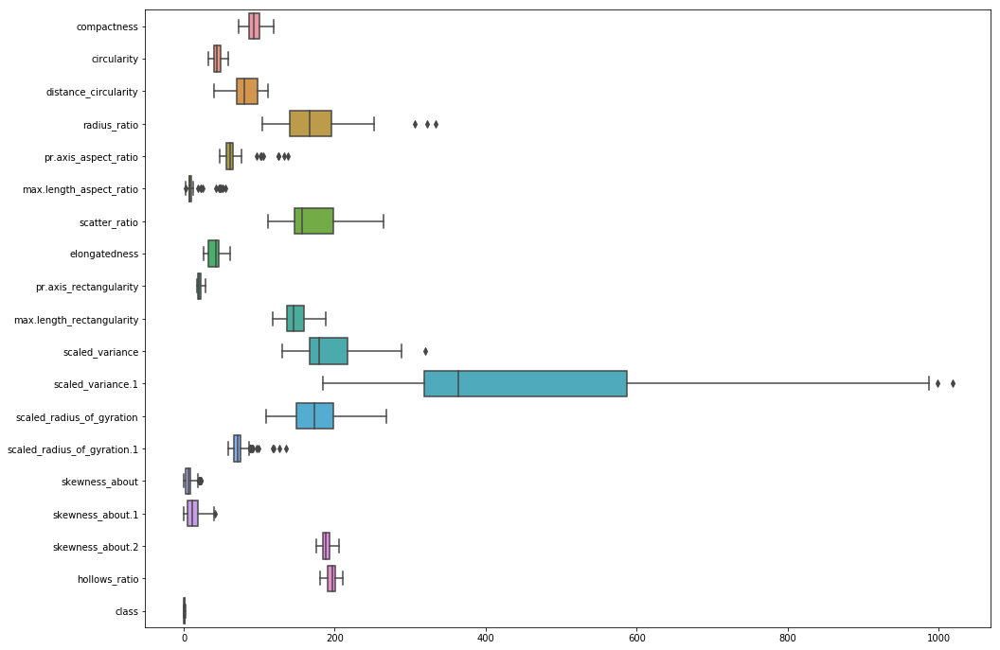

In [16]:
plt.figure(figsize = (16,12))
sns.boxplot(data=veh_df_nomissing, orient='h')

<font color="#07bdf5" style="font-family:courier;font-size:24px;">Observation: the <font color="red">outliers</font> are </font>
<font color="#07bdf5" style="font-family:courier;font-size:16px;">
<ul>
    <li>pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_radius_of_gyration.1, skewness_about</li>
</ul>

In [17]:
#removing out liers - first let us find IQR values for each columns
from scipy.stats import iqr
Q1 = veh_df_nomissing.quantile(0.25)
Q3 = veh_df_nomissing.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

compactness                     13.00
circularity                      9.00
distance_circularity            28.00
radius_ratio                    54.00
pr.axis_aspect_ratio             8.00
max.length_aspect_ratio          3.00
scatter_ratio                   51.00
elongatedness                   13.00
pr.axis_rectangularity           4.00
max.length_rectangularity       22.00
scaled_variance                 50.00
scaled_variance.1              268.50
scaled_radius_of_gyration       49.00
scaled_radius_of_gyration.1      8.00
skewness_about                   7.00
skewness_about.1                14.00
skewness_about.2                 9.00
hollows_ratio                   10.75
class                            1.00
dtype: float64


In [18]:
veh_df_nooutlyrs = veh_df_nomissing[~((veh_df_nomissing < (Q1 - 1.5 * IQR)) |(veh_df_nomissing > (Q3 + 1.5 * IQR))).any(axis=1)]
veh_df_nooutlyrs.shape

(813, 19)

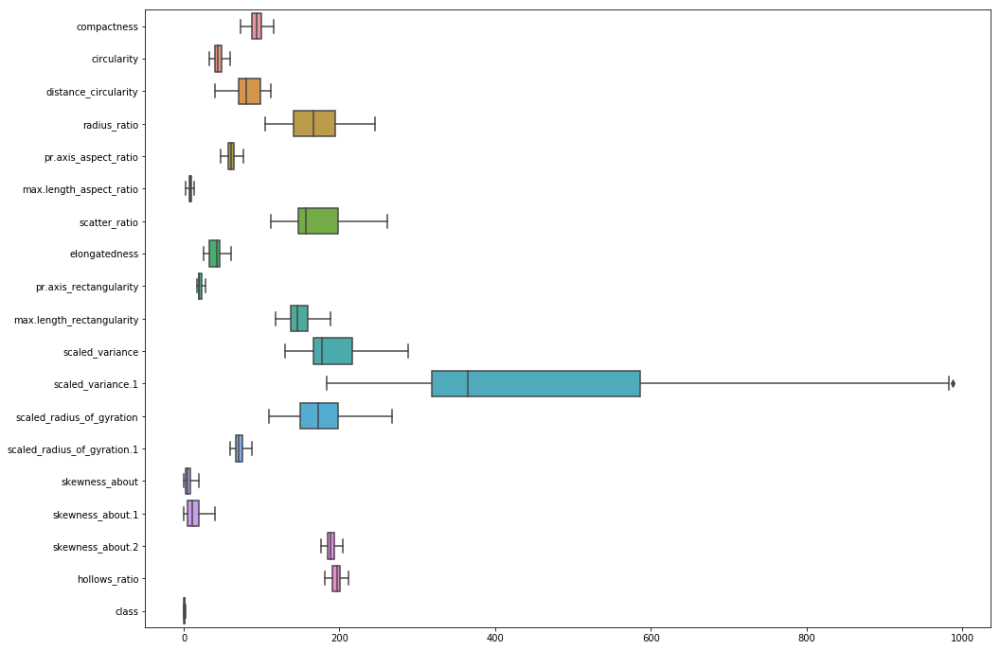

In [19]:
#Once again verifying the outliers with Box Plot
plt.figure(figsize = (16,12))
sns.boxplot(data=veh_df_nooutlyrs, orient='h')

<font color="#07bdf5" style="font-family:courier;font-size:24px;">Observation: removal of  <font color="red">outliers</font> removed 33 observations(846 - 813) </font>

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a1d4372b0>,
      dtype=object)

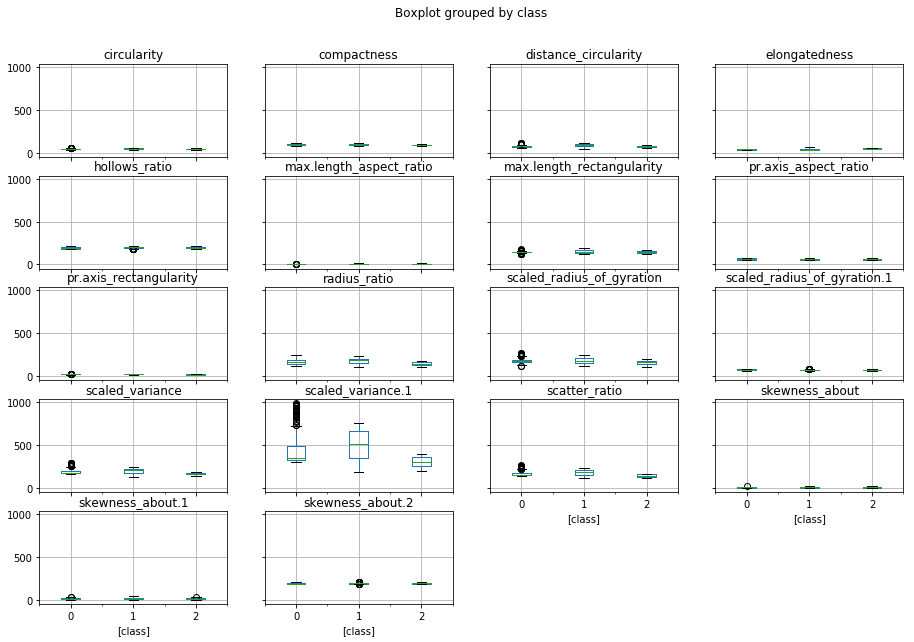

In [20]:
veh_df_nooutlyrs.boxplot(by='class', layout = (5,4),figsize=(15,10))

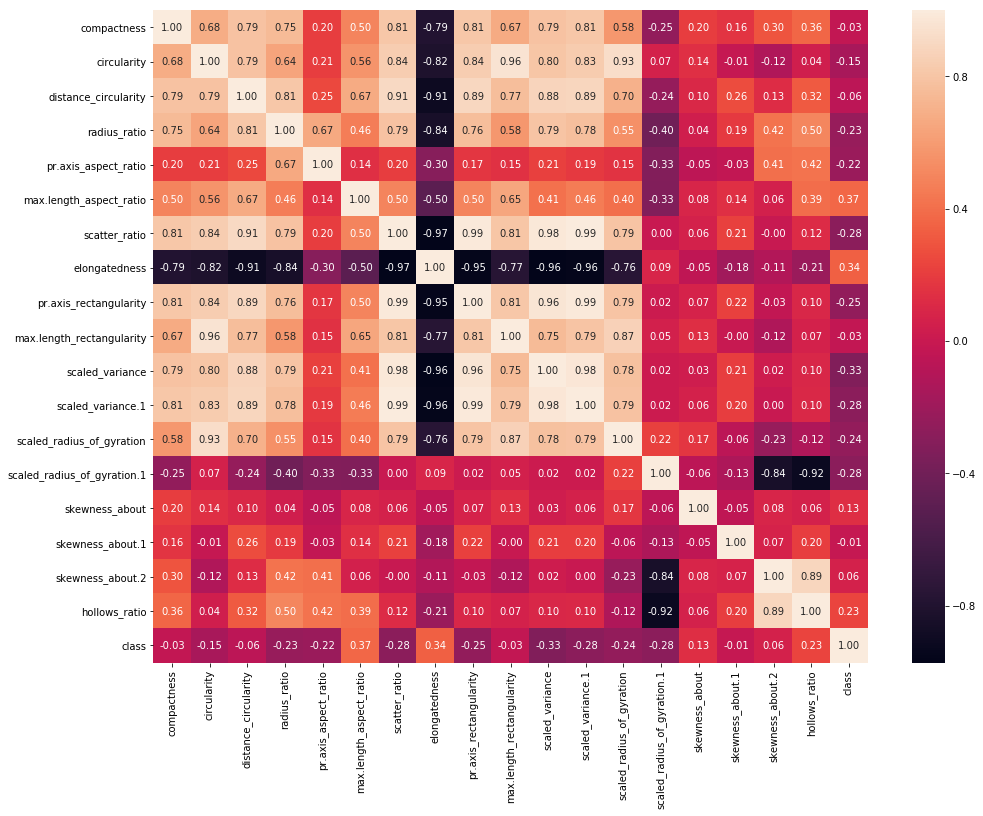

In [21]:
import pylab as pl
pl.figure(figsize = (16,12))
sns.heatmap(veh_df_nooutlyrs.corr(),  annot=True, fmt='0.2f')

<font color="#07bdf5" style="font-family:courier;font-size:24px;">Observation: Most of the variables are highly correlated</font>
<font color="#07bdf5" style="font-family:courier;font-size:16px;">
<ul>
    <li><font color="red">Highly correlated</font> attributes:</li>
    <li>scatter_ratio is highly correlated with elongatedness, pr.axis_rectangularity, scaled_variance, scaled_variance.1</li>
    <li>elongatedness is correlated with scatter_ratio,distance_circularity, pr.axis_rectangularity,scaled_variance, scaled_variance.1 </li>
    <li>circularity is highly correlated with max.length_rectangularity and scaled_radius_of_gyration</li>   
    <li><font color="orange">Moderately correlated</font> attributes</li>
    <li>elongatedness is correlated with compactness, circularity, radius_ratio, max.length_rectangularity, scaled_radius_of_gyration</li>
    <li>Following attributes are correlated with each other : scatter_ratio
elongatedness,
pr.axis_rectangularity,
max.length_rectangularity,
scaled_variance,
scaled_variance.1,
scaled_radius_of_gyration,
</li>
    <li>scaled_radius_of_gyration.1 is correalated with skewness_about.2 AND hollows_ratio
</li>
</ul>
    </font>

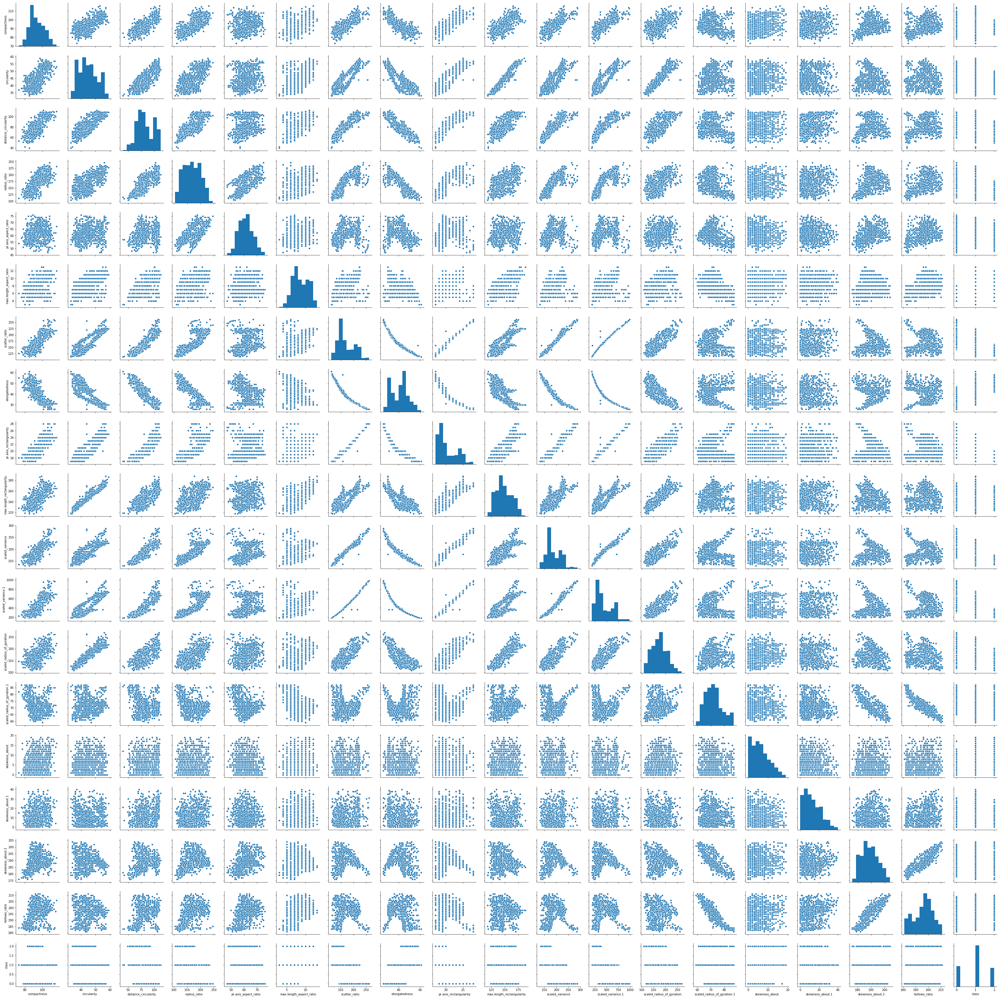

In [22]:
sns.pairplot(veh_df_nooutlyrs)

<font color="#07bdf5" style="font-family:courier;font-size:24px;">Observation:From this pair plot analysis, it is evident that Most of the attributes are NORMALLY distributed. Also observed that attributes are highly correlated either positevely or negatively</font>
<font color="#07bdf5" style="font-family:courier;font-size:16px;">
<ul>
    <li><font color="red">Normally distributed </font> attributes:</li>
        <li>compactness, circularity, distance_circularity, pr.axis_aspect_ratio,scatter_ratio, elongatedness, max.length_rectangularity, scaled_variance, scaled_radius_of_gyration,hollows_ratio, class
</li>
    <li><font color="red">Right skewed are: </font>skewness_about, skewness_about.1,scaled_variance.1,pr.axis_rectangularity, 
</li>

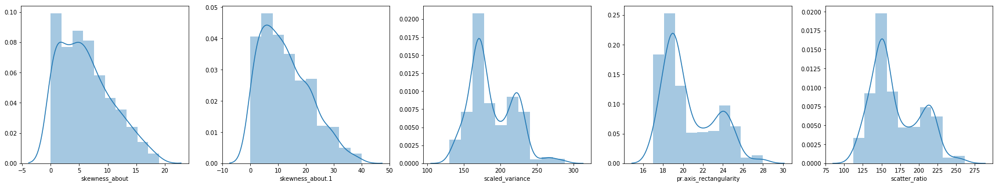

In [23]:
#analyzing the distribution of columns identified with skewness skewness_about.1, skewness_about.2,scaled_variance.1,pr.axis_rectangularity, 
fn, ax = plt.subplots(1, 5, figsize=(30,5))
dp1 = sns.distplot(veh_df_nooutlyrs["skewness_about"],bins=10, ax= ax[0])
dp2 = sns.distplot(veh_df_nooutlyrs["skewness_about.1"],bins=10, ax=ax[1])
dp3 = sns.distplot(veh_df_nooutlyrs["scaled_variance"],bins=10, ax= ax[2])
dp4 = sns.distplot(veh_df_nooutlyrs["pr.axis_rectangularity"],bins=10, ax=ax[3])
dp5 = sns.distplot(veh_df_nooutlyrs["scatter_ratio"],bins=10, ax=ax[4])
fn.savefig('skewness_plot.png')

<h2><font color="#07bdf5"><font color="red">Iteration 1</font>Trying the Dataset with <u>all the features</u> to buid models and look at efficiency</font></h2>
<h2><font color="#07bdf5">4.Model Creation Using classification alogrithms for Multiclass classification</font></h2>

In [24]:
from sklearn.model_selection import train_test_split
#splitting training and testing data
X_train, X_test = train_test_split(veh_df_nooutlyrs , test_size=0.3, random_state=1)
y_train = X_train.pop("class")
y_test = X_test.pop("class")
modelscorecard={} #defining a dictionary to comparing different model

In [25]:
def calculate_accuracy(confusion_matrix):
    accuracy = (confusion_matrix[0][0]+confusion_matrix[1][1])/(confusion_matrix[0][0]+confusion_matrix[0][1]+confusion_matrix[1][0]+confusion_matrix[1][1])
    return accuracy

In [26]:
from sklearn import metrics
def draw_conmmat( actual, predicted, modelname): #creating this as function as I am planning to reuse
    cm = metrics.confusion_matrix( actual, predicted, [0,1,2] )
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = ["Bus", "Car","Van"] , yticklabels = ["Bus", "Car","Van"] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label - '+str(modelname))
    plt.show()

<font color="blue"><b>KNN</b></font>

In [27]:
from sklearn.neighbors import KNeighborsClassifier

def do_KNN(X_train,X_test,y_train,y_test, K_value): #defining this as function as I have to reuse
    NNH = KNeighborsClassifier(n_neighbors= K_value , weights = 'uniform', metric='euclidean' )
    NNH.fit(X_train, y_train)
    # For every test data point, predict it's label based on 5 nearest neighbours in this model. The majority class will 
    # be assigned to the test data point
    KNNpredict = NNH.predict(X_test)
    score = NNH.score(X_test, y_test)
    return score,KNNpredict

In [28]:
#Finding KNNscore for K value 1 to 20 - TO GET THE OPTIMUM K VALUE
for i in range(1,21):
    KNNscore,KNNpredict = do_KNN(X_train,X_test,y_train,y_test,i)# applying K values from 1 to 20
    print("When K value is "+str(i)+" score = "+str(KNNscore))

When K value is 1 score = 0.8770491803278688
When K value is 2 score = 0.8565573770491803
When K value is 3 score = 0.8688524590163934
When K value is 4 score = 0.8852459016393442
When K value is 5 score = 0.8442622950819673
When K value is 6 score = 0.8647540983606558
When K value is 7 score = 0.8360655737704918
When K value is 8 score = 0.8319672131147541
When K value is 9 score = 0.819672131147541
When K value is 10 score = 0.8278688524590164
When K value is 11 score = 0.8319672131147541
When K value is 12 score = 0.8278688524590164
When K value is 13 score = 0.819672131147541
When K value is 14 score = 0.8319672131147541
When K value is 15 score = 0.8155737704918032
When K value is 16 score = 0.8032786885245902
When K value is 17 score = 0.8032786885245902
When K value is 18 score = 0.7909836065573771
When K value is 19 score = 0.7950819672131147
When K value is 20 score = 0.7950819672131147


The optimum K Value here is <font color="red">4</font> with 88.52

In [29]:
# applying K value as 4
optimum_kvalue = 4
KNNscore,KNNpredict = do_KNN(X_train,X_test,y_train,y_test,optimum_kvalue)
print("When K value is "+str(optimum_kvalue)+" score = "+str(KNNscore))
print("Confusion matrix for KNN is")
conf_matrix= confusion_matrix(y_test,KNNpredict)
modelscorecard["KNN"] = KNNscore

When K value is 4 score = 0.8852459016393442
Confusion matrix for KNN is


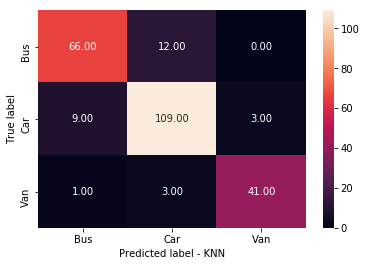

In [30]:
draw_conmmat(y_test,KNNpredict,"KNN")

In [31]:
from sklearn.metrics import classification_report
print(classification_report(y_test, KNNpredict))

              precision    recall  f1-score   support

           0       0.87      0.85      0.86        78
           1       0.88      0.90      0.89       121
           2       0.93      0.91      0.92        45

   micro avg       0.89      0.89      0.89       244
   macro avg       0.89      0.89      0.89       244
weighted avg       0.89      0.89      0.89       244



<font color="blue"><b>KMeans</b></font>

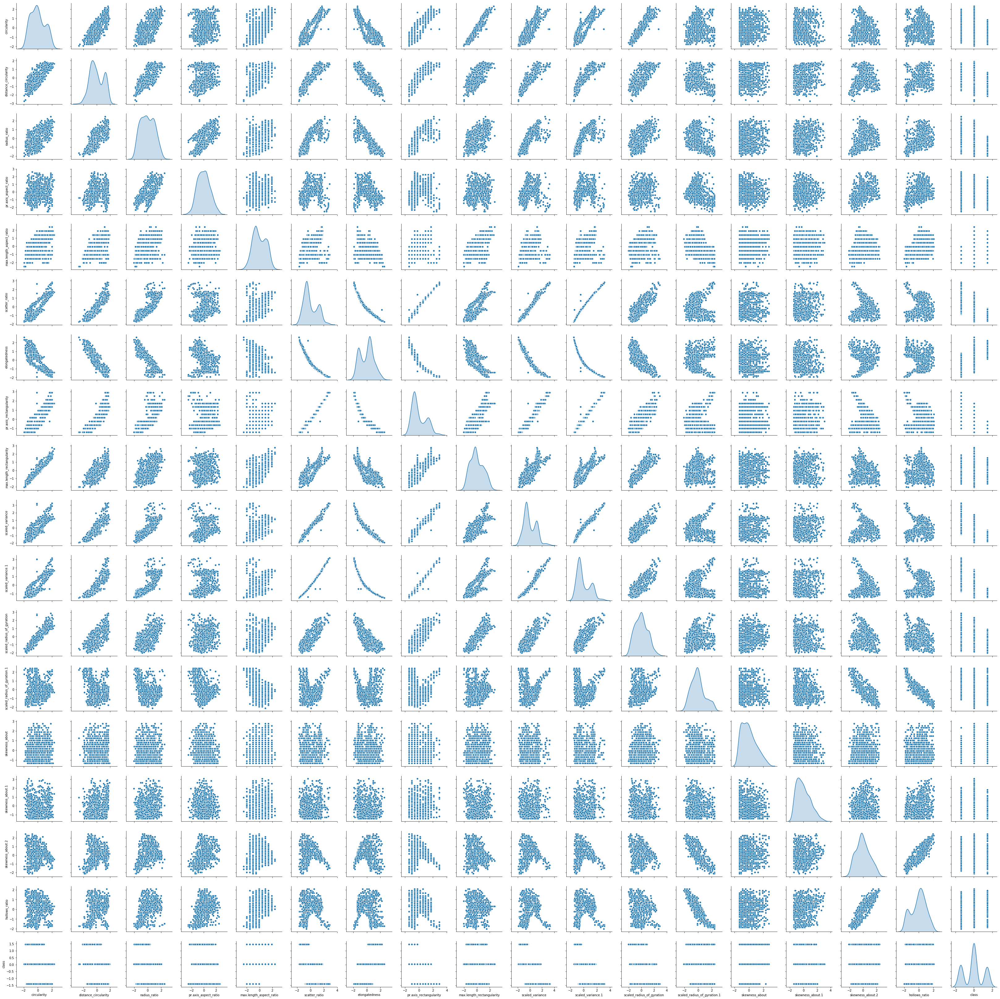

In [32]:
from scipy.stats import zscore
veh_df_attr=veh_df_nooutlyrs.iloc[:,1:]
veh_df_scaled=veh_df_attr.apply(zscore)
sns.pairplot(veh_df_scaled,diag_kind='kde')

<font color="blue">K-Means with all 18 features</font> : though it is for Unlabled Unsupervised learning model, where we are dealing with labled classification problem, just wanted to test with K-Means

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

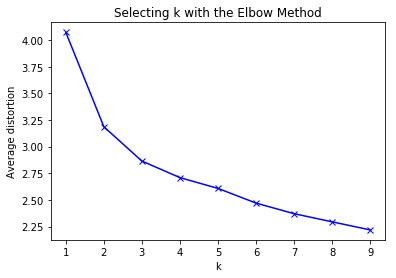

In [33]:
#Finding optimal no. of clusters
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(veh_df_scaled)
    prediction=model.predict(veh_df_scaled)
    meanDistortions.append(sum(np.min(cdist(veh_df_scaled, model.cluster_centers_, 'euclidean'), axis=1)) / veh_df_scaled.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

In [34]:
#  Let us next try with K = 3, the elbow point

In [35]:
def get_KMeans_accuracy(model,X,y): 
    score = 0
    for i in range(len(X)):
        predict_me = np.array(X[i].astype(float))
        predict_me = predict_me.reshape(-1, len(predict_me))
        prediction = model.predict(predict_me)
        if prediction[0] == y[i]:
            score += 1
    return score/len(X)

In [36]:
veh_dfkm = veh_df_nooutlyrs.copy()
veh_df_independent = np.array(veh_dfkm.iloc[:,0:18]).astype(float)
veh_df_dependent = np.array(veh_dfkm.iloc[:,18])
# with Optimum K = 3
print(veh_df_independent.shape,veh_df_dependent.shape)
model = KMeans(3)
model.fit(veh_df_independent)
prediction=model.predict(veh_df_independent)
KMeansAccuracy =get_KMeans_accuracy(model,veh_df_independent,veh_df_dependent) 
print(KMeansAccuracy)
# pcaKMscore = do_KMeans(veh_df_independent, optimum_kvalue)
# print("When K value is "+str(optimum_kvalue)+" score = "+str(pcaKMscore))

(813, 18) (813,)
0.48093480934809346


<font color="blue">KMeans with all 18 features is predicting with accuracy <font color="red">48%</font></font>

In [37]:
veh_def_clust = veh_dfkm.groupby(['class'])
veh_def_clust.mean()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
0,91.562500,44.846154,76.730769,165.187500,63.038462,6.408654,169.432692,40.149038,20.524038,146.485577,191.572115,445.274038,179.956731,76.367788,4.817308,10.230769,188.120192,191.658654
1,95.971154,46.004808,88.819712,180.314904,60.987981,8.798077,181.014423,38.074519,21.507212,149.918269,197.889423,499.776442,179.459135,70.039663,6.718750,15.161058,189.336538,197.430288
2,90.677249,42.089947,73.455026,143.529101,59.566138,8.518519,141.597884,47.910053,18.592593,145.248677,162.000000,298.407407,157.037037,71.529101,6.481481,9.640212,189.158730,196.349206


<font color="blue"><b>Naïve Bayes</b></font>


In [38]:

from sklearn.naive_bayes import GaussianNB 

def do_naive_bayes(X_trainNB,y_trainNB,X_testNB,y_testNB):
    
    naive_model = GaussianNB()
    naive_model.fit(X_trainNB, y_trainNB)

    NBpredict = naive_model.predict(X_testNB)
    NBscore = naive_model.score(X_testNB,y_testNB)
    return NBscore,NBpredict

In [39]:
from sklearn.metrics import f1_score
models_df=pd.DataFrame(columns=['Model', 'Accuracy', 'F1Score'])
models_df["Model"] = modelscorecard.keys()
models_df["Accuracy"] = modelscorecard.values()

In [40]:
from sklearn.metrics import f1_score
NBscore, NBpredicted_labels = do_naive_bayes(X_train,y_train,X_test,y_test)
print("Score in Naive Bayes : ",NBscore)
modelscorecard["Naive Bayes"]=NBscore

NBf1score = f1_score(y_test,NBpredicted_labels, average="weighted")
models_df.loc[len(models_df)] = [ "Naive Bayes",NBscore,NBf1score ]
print("Confusion matrix for Naive Bayes : ")
print(y_test.shape,"\n\n",NBpredicted_labels.shape)
#con_matrix = confusion_matrix(y_test.tolist(), NBpredicted_labels.tolist())
models_df["F1Score"][0] = f1_score(y_test,KNNpredict, average="weighted")
models_df["F1Score"][1] = f1_score(y_test,NBpredicted_labels,average="weighted")

Score in Naive Bayes :  0.5819672131147541
Confusion matrix for Naive Bayes : 
(244,) 

 (244,)


/Users/thiru/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()
/Users/thiru/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':


In [41]:
from sklearn.metrics import classification_report
print(classification_report(y_test, NBpredicted_labels))

              precision    recall  f1-score   support

           0       0.79      0.24      0.37        78
           1       0.80      0.71      0.75       121
           2       0.33      0.82      0.47        45

   micro avg       0.58      0.58      0.58       244
   macro avg       0.64      0.59      0.53       244
weighted avg       0.71      0.58      0.58       244



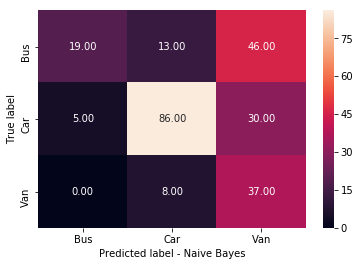

In [42]:
draw_conmmat(y_test,NBpredicted_labels,"Naive Bayes")

In [43]:
models_df

,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572


<font color="blue"><b>Random Forest</b></font>

In [44]:
from sklearn.ensemble import RandomForestClassifier
def do_randomforest(X_trainRF,y_trainRF,X_testRF,y_testRF, nsti=20, criterion="entropy", w1=0.5,w2=1, maxdepth=10,minleaf=5):
    rfcl = RandomForestClassifier(random_state=0, criterion = 'entropy',n_estimators=nsti, class_weight={0:w1,1:w2}, max_depth = maxdepth, min_samples_leaf=minleaf)
    rfcl = rfcl.fit(X_trainRF, y_trainRF)
    RFpredict = rfcl.predict(X_testRF)
    RFscore = rfcl.score(X_testRF , y_testRF)
    return RFscore,RFpredict

In [45]:
RFscore, RFpredicted_labels = do_randomforest(X_train,y_train,X_test,y_test)
print("Score in Random Forest : ",RFscore)
modelscorecard["Random Forest"]=RFscore

RFf1score = f1_score(y_test,RFpredicted_labels, average="weighted")
models_df.loc[len(models_df)] = [ "Random Forest",RFscore,RFf1score ]
print(y_test.shape,"\n\n",RFpredicted_labels.shape)
models_df

Score in Random Forest :  0.9631147540983607
(244,) 

 (244,)


,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572
2,Random Forest,0.963115,0.963115


Confusion matrix for Random Forest : 


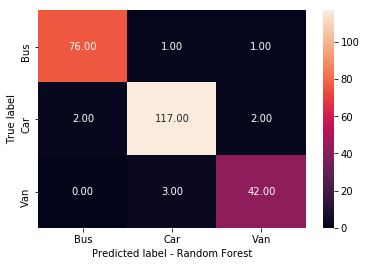

              precision    recall  f1-score   support

           0       0.97      0.97      0.97        78
           1       0.97      0.97      0.97       121
           2       0.93      0.93      0.93        45

   micro avg       0.96      0.96      0.96       244
   macro avg       0.96      0.96      0.96       244
weighted avg       0.96      0.96      0.96       244



In [46]:
print("Confusion matrix for Random Forest : ")
draw_conmmat(y_test,RFpredicted_labels,"Random Forest")
print(classification_report(y_test, RFpredicted_labels))

<font color="blue"><b>Support Vector Machine</b></font>

In [47]:
from sklearn import svm
def do_SVM(X_train,X_test,y_train,y_test, c_value,kernalval): #defining this as function as I have to reuse
    SVM = svm.SVC(gamma=0.025, C=c_value, kernel=kernalval)  
    SVM.fit(X_train, y_train)
    # For every test data point, predict it's label based on 5 nearest neighbours in this model. The majority class will 
    # be assigned to the test data point
    SVMpredict = SVM.predict(X_test)
    score = SVM.score(X_test, y_test)
    return score,SVMpredict

In [48]:
kernals = ["linear","rbf"]
cvals = [0.01, 0.05, 0.5, 1]
#Executing Support Vector Machine classifier for different combinations
#Here finding all values of parameters, but later will do the same with GridSearchCV Hyper Parameter tuning
for i in range(0,len(kernals)):
    for j in range(0,len(cvals)):
        SVMscore,SVMPredict = do_SVM(X_train,X_test,y_train,y_test,cvals[j],kernals[i])
        SVMf1score = f1_score(y_test,SVMPredict, average="weighted")
        models_df.loc[len(models_df)] = [ "SVM-c:"+str(cvals[j])+"kernal:"+kernals[i],SVMscore,SVMf1score ]
models_df

/Users/thiru/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/thiru/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/thiru/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572
2,Random Forest,0.963115,0.963115
3,SVM-c:0.01kernal:linear,0.938525,0.938831
4,SVM-c:0.05kernal:linear,0.967213,0.967216
5,SVM-c:0.5kernal:linear,0.950820,0.9507
6,SVM-c:1kernal:linear,0.950820,0.950767
7,SVM-c:0.01kernal:rbf,0.495902,0.32879
8,SVM-c:0.05kernal:rbf,0.495902,0.32879
9,SVM-c:0.5kernal:rbf,0.495902,0.32879


<img src="./modelcomp1.png" alt="Model Compare image" height="900" width="400"></img>
<font color="blue">Observations: Support Vector model (SVM-c:0.05kernal:linear)with all 18 features is predicting with accuracy <font color="red">96.72%</font>with f1score 96.72</font> 

In [49]:
#Calculating with optimum C value and Linear kernal to get confusion matrix and other metrics
SVMscore,SVMPredict = do_SVM(X_train,X_test,y_train,y_test,0.05,"linear")
print("Score in Support Vector Classifier : ",SVMscore)
modelscorecard["Support Vector Classifier"]=SVMscore

SVMf1score = f1_score(y_test,RFpredicted_labels, average="weighted")
models_df.loc[len(models_df)] = [ "Support Vector Classifier(optimum parameters)",SVMscore,SVMf1score ]
print(y_test.shape,"\n\n",SVMPredict.shape)


Score in Support Vector Classifier :  0.9672131147540983
(244,) 

 (244,)


Score in Support Vector Classifier :  0.9672131147540983
Confusion matrix for Support Vector Classifier : 


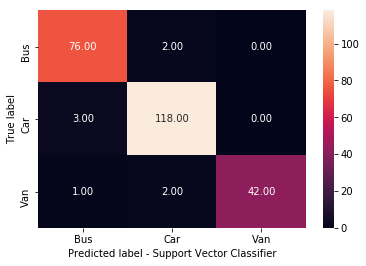

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        78
           1       0.97      0.98      0.97       121
           2       1.00      0.93      0.97        45

   micro avg       0.97      0.97      0.97       244
   macro avg       0.97      0.96      0.97       244
weighted avg       0.97      0.97      0.97       244



In [50]:
print("Score in Support Vector Classifier : ",SVMscore)
print("Confusion matrix for Support Vector Classifier : ")
draw_conmmat(y_test,SVMPredict,"Support Vector Classifier")
print(classification_report(y_test, SVMPredict))

<font color="blue">Observations: As explained and as per findings the analysis, more than 50% of the features are HIGHLY CORRELATED, hence considering only the features that decides using <font color="red">Dimensionality Reduction</font> technique PCA</font>
<h2><font color="#07bdf5">PCA - Principle Component Analysis </font></h2><br>
The steps: (Intially doing these manually, later performed using PCA inbuilt package )
<ol>
    <li>Scale</li>
    <li>Find Covariance Matrix</li>
    <li>Break covariance matrix into Magnitude & Direction Eigen values and Eigen Vectors covariance matrix can be tought of as the natural axis and magnitude along the axis</li>
    <ul>
    <li>Eigen values of the covarience matrix are the PRINCIPAL COMPONENTS</li>
    <li>They are all together to each other independent</li>
    <li>Eigen values acan also be used to calculate the percentage of variance explained</li>
    </ul>
    <li>Sort the eigen values in decending order and calculate the cumulative percentage of variance explained</li>
    <li>Pick the number of principal components to be used</li>
    <li>Transform to new variables</li>
    
</ol>
    


In [51]:
from sklearn.preprocessing import StandardScaler
 
veh_df_independent = veh_df_nooutlyrs.iloc[:,0:18] #capturing independent attributes
veh_df_dependent = veh_df_nooutlyrs.iloc[:,18] #Seperating the target attribute 'class'
#Transforming the dataset veh_df_independent (independent variable data) to normalize it using standardscalar through transformation. We will create the PCA dimensions
# on this distribution.
#Scaling Independent Dataset
sc = StandardScaler()
veh_df_std =  sc.fit_transform(veh_df_independent)
#veh_df_features.head(40)

In [52]:
#Calculating covarience matrix 
cov_mat = np.cov(veh_df_std.T)
print("Covariance Matrix atributes:",cov_mat.shape) #Must have 18X18
print("Covariance Matrix",cov_mat)

Covariance Matrix atributes: (18, 18)
Covariance Matrix [[ 1.00123153e+00  6.80164027e-01  7.87792814e-01  7.46906930e-01
   2.00881439e-01  4.98273207e-01  8.11840645e-01 -7.89531434e-01
   8.12866245e-01  6.74996601e-01  7.92438680e-01  8.13494150e-01
   5.78399755e-01 -2.53990635e-01  2.00887113e-01  1.61304844e-01
   2.95777412e-01  3.64608943e-01]
 [ 6.80164027e-01  1.00123153e+00  7.87747162e-01  6.41725205e-01
   2.06409699e-01  5.64854067e-01  8.44804611e-01 -8.16768295e-01
   8.41196310e-01  9.62404205e-01  8.03750964e-01  8.33508154e-01
   9.26281607e-01  6.67790806e-02  1.40563881e-01 -1.43598307e-02
  -1.16976151e-01  3.92302597e-02]
 [ 7.87792814e-01  7.87747162e-01  1.00123153e+00  8.09326627e-01
   2.45756551e-01  6.69657073e-01  9.06692225e-01 -9.09806087e-01
   8.95884623e-01  7.69635504e-01  8.85221631e-01  8.89286924e-01
   7.03348558e-01 -2.38231284e-01  9.89345733e-02  2.63832735e-01
   1.29070982e-01  3.22051625e-01]
 [ 7.46906930e-01  6.41725205e-01  8.09326627e-

In [53]:
#Getting Eigenvalues and Eigen vectors
evals, evectors = np.linalg.eig(cov_mat)
print('Eigen Vectors \n', evectors)
print('\n Eigen Values \n', evals)

Eigen Vectors 
 [[-2.72251046e-01 -8.97284818e-02  2.26045073e-02  1.30419032e-01
  -1.52324139e-01  2.58374578e-01 -1.88794221e-01 -7.71578238e-01
  -3.61784776e-01 -1.25233628e-01  2.92009470e-02  7.62442008e-04
  -1.06680587e-02  1.05983722e-02 -1.01407495e-01 -1.46326861e-01
  -3.81638532e-03  3.32992130e-03]
 [-2.85370045e-01  1.33173937e-01  2.10809943e-01 -2.06785531e-02
   1.39022591e-01 -6.88979940e-02  3.90871235e-01 -6.60528436e-02
  -4.62957583e-02  2.40262612e-01  7.29503235e-02  1.93799916e-01
  -7.74670931e-03 -8.71766559e-02 -3.11337823e-01  1.96463651e-01
  -2.96230720e-01  5.83996136e-01]
 [-3.01486231e-01 -4.40259591e-02 -7.08780817e-02  1.07425217e-01
   8.07335409e-02 -2.04800896e-02 -1.76384547e-01  2.98693883e-01
  -2.64499195e-01 -9.42971834e-02  7.78755026e-01 -2.32649049e-01
   1.11905744e-02  2.28724292e-02  5.89166755e-02  5.33931974e-02
   9.72735293e-02  8.64160083e-02]
 [-2.72594510e-01 -2.04232234e-01 -4.02139629e-02 -2.52957341e-01
  -1.19012554e-01 -1.

In [54]:
# Creating (eigenvalue, eigenvector) pairs:
epairs = [(evals[index], evectors[:,index]) for index in range(len(evals))]
# Sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalues
epairs.sort()
epairs.reverse()
print(epairs)
# Getting the descending ordered eigenvalues and eigenvectors
evals_sorted = [epairs[index][0] for index in range(len(evals))]
evectors_sorted = [epairs[index][1] for index in range(len(evals))]
# Checking sorted eigenvalue, eigenvector pairs
print('Eigenvalues in descending order: \n', evals_sorted)

[(9.792975698382946, array([-0.27225105, -0.28537005, -0.30148623, -0.27259451, -0.09857976,
       -0.19475579, -0.31051844,  0.30843834, -0.30754849, -0.27630107,
       -0.30274811, -0.30704063, -0.26152049,  0.04363236, -0.0367057 ,
       -0.05885041, -0.03483739, -0.08281362])), (3.3771064398939745, array([-0.08972848,  0.13317394, -0.04402596, -0.20423223, -0.25913686,
       -0.09457563,  0.07233508, -0.01168768,  0.08409153,  0.12583663,
        0.07019986,  0.07793366,  0.20992728,  0.50391445, -0.01456825,
       -0.09339805, -0.50166421, -0.50654656])), (1.208730539635098, array([ 0.02260451,  0.21080994, -0.07087808, -0.04021396,  0.11480523,
        0.13931348, -0.1129247 ,  0.09003305, -0.11106355,  0.21987769,
       -0.14481876, -0.11532395,  0.21362744, -0.06739209,  0.52162344,
       -0.68717064,  0.06220695,  0.04080354])), (1.1365956021766952, array([ 0.13041903, -0.02067855,  0.10742522, -0.25295734, -0.605228  ,
        0.32253141, -0.01005404,  0.07991176,  0.0

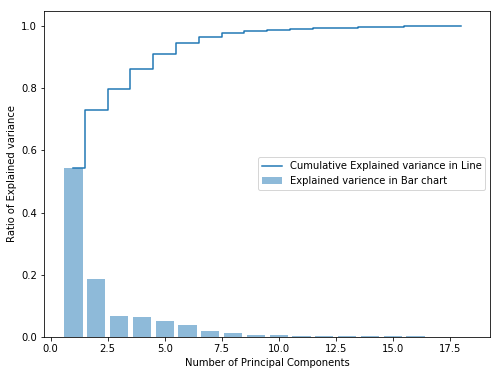

In [55]:
#Ploting elbow curve to find the optimum number of attributes
sumofevals = sum(evals)
var_explained = [(i / sumofevals) for i in sorted(evals, reverse=True)]  
cum_var_exp = np.cumsum(var_explained)  # an array of cumulative variance. 
plt.figure(figsize = (8,6))
plt.bar(range(1,19), var_explained, alpha=0.5, align='center', label='Explained varience in Bar chart')
plt.step(range(1,19),cum_var_exp, where= 'mid', label='Cumulative Explained variance in Line')
plt.ylabel('Ratio of Explained variance')
plt.xlabel('Number of Principal Components')
plt.legend(loc = 'center right')
plt.show()

<img src="./explainedvariance.png" alt="Explained variance image" height="700" width="500"></img>
<font color="blue">Observations: From the explained variance derived from Eigen Values and Eigen Vectors, the elbow indicates number of Principal Components are 8. <font color="red">Dimensionality Reduction</font> technique PCA reducing number of attributes to <font color="red">8</font></font>

In [56]:
# veh_df_reduce represents reduced mathematical space....
veh_df_reduce = np.array(evectors_sorted[0:8])   # Reducing from 18 to 8
veh_df_std_8D = np.dot(veh_df_std,veh_df_reduce.T)   # projecting original data into principal component dimensions
reduced_pca_veh_df = pd.DataFrame(veh_df_std_8D)  # converting array to dataframe for pairplot
reduced_pca_veh_df.head(10)

,0,1,2,3,4,5,6,7
0,-0.591125,-0.655523,0.564477,-0.659870,0.855251,-1.835814,0.155983,-0.683144
1,1.524878,-0.327117,0.251528,1.296236,0.282463,-0.091649,-0.209862,0.127745
2,-3.969982,0.239514,1.229875,0.180391,-0.919360,-0.650638,-0.826445,0.163185
3,1.549729,-3.037566,0.466449,0.394413,0.623392,0.383794,-0.131539,-0.176248
4,-5.468963,4.651385,-1.290061,0.023804,-1.692033,2.510965,-0.315330,0.475009
5,0.817752,-2.237629,1.957884,-0.353500,-1.516378,0.660205,0.398988,-0.126521
6,1.979236,-1.541529,1.102405,-0.763912,1.249974,0.086295,0.318551,-0.348154
7,4.424260,-3.292527,-0.548192,0.041677,0.469469,0.648896,0.362902,-0.189677
8,-1.245871,-1.960773,-0.501227,0.516627,1.049632,0.403609,-0.701793,0.731485
9,3.342705,-2.038225,-0.260740,0.027417,1.122078,0.339754,-0.452460,0.154058


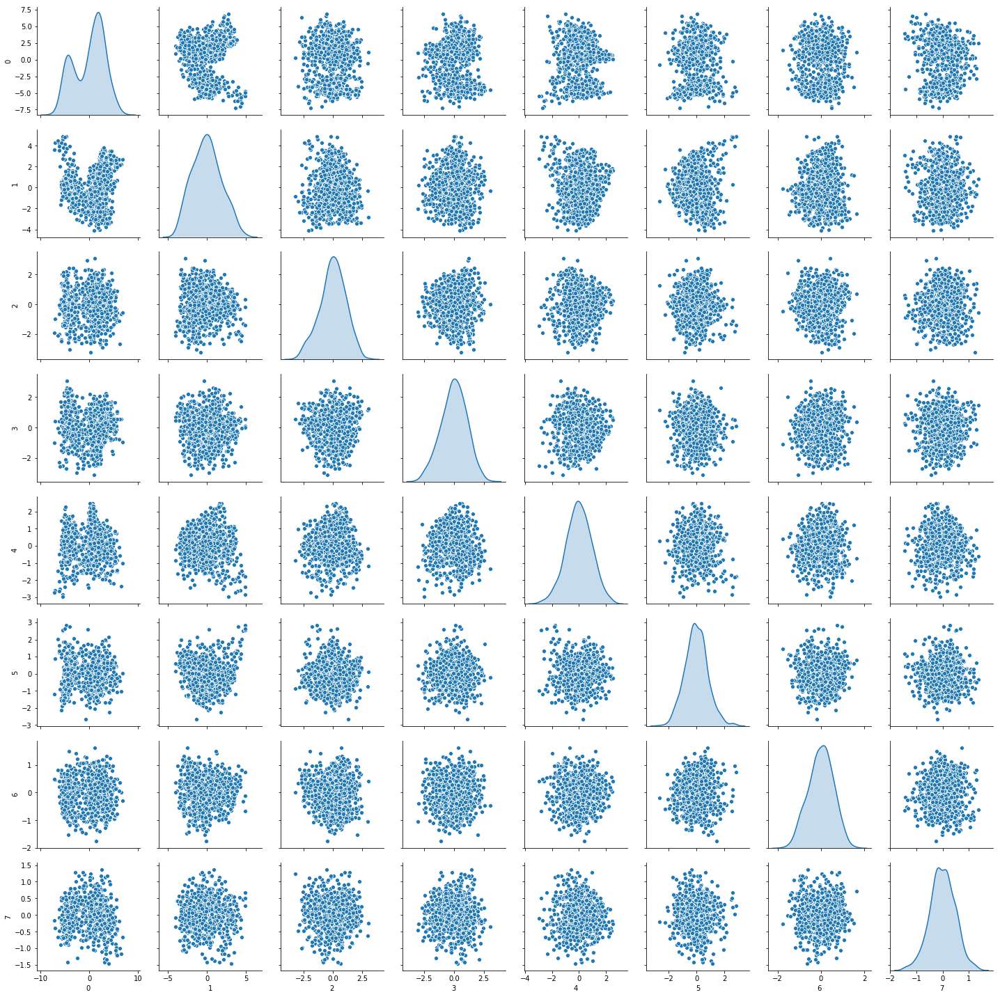

In [57]:
sns.pairplot(reduced_pca_veh_df, diag_kind='kde') 

<h2><font color="#07bdf5">From the above pair plot it is evident that After PCA the dimensions are <font color="red">not correlated, they do not have linear relationship among themselfs</font>, the reduced 8 features are independent. Hence met the objective of PCA</font></h2><br>

In [58]:
#Doing the same PCA with built in methods
from sklearn.decomposition import PCA
pca = PCA(n_components=18)
pca.fit(veh_df_std)
print("Eigen Values",pca.explained_variance_)

Eigen Values [9.79297570e+00 3.37710644e+00 1.20873054e+00 1.13659560e+00
 8.96286859e-01 6.58293128e-01 3.23056525e-01 2.26906613e-01
 1.12741686e-01 7.62069059e-02 6.18393099e-02 4.42420969e-02
 2.99919142e-02 2.67735138e-02 1.94537446e-02 1.77191935e-02
 1.01216098e-02 3.12610726e-03]


In [59]:
print("Eigen Vectors",pca.components_)

Eigen Vectors [[ 2.72251046e-01  2.85370045e-01  3.01486231e-01  2.72594510e-01
   9.85797647e-02  1.94755787e-01  3.10518442e-01 -3.08438338e-01
   3.07548493e-01  2.76301073e-01  3.02748114e-01  3.07040626e-01
   2.61520489e-01 -4.36323635e-02  3.67057041e-02  5.88504115e-02
   3.48373860e-02  8.28136172e-02]
 [-8.97284818e-02  1.33173937e-01 -4.40259591e-02 -2.04232234e-01
  -2.59136858e-01 -9.45756320e-02  7.23350799e-02 -1.16876769e-02
   8.40915278e-02  1.25836631e-01  7.01998575e-02  7.79336637e-02
   2.09927277e-01  5.03914450e-01 -1.45682524e-02 -9.33980545e-02
  -5.01664210e-01 -5.06546563e-01]
 [-2.26045073e-02 -2.10809943e-01  7.08780817e-02  4.02139629e-02
  -1.14805227e-01 -1.39313484e-01  1.12924698e-01 -9.00330455e-02
   1.11063547e-01 -2.19877688e-01  1.44818765e-01  1.15323952e-01
  -2.13627435e-01  6.73920886e-02 -5.21623444e-01  6.87170643e-01
  -6.22069465e-02 -4.08035393e-02]
 [-1.30419032e-01  2.06785531e-02 -1.07425217e-01  2.52957341e-01
   6.05228001e-01 -3.22

In [60]:
print("Percentage of variance explained by each Eigen vectors:\n",pca.explained_variance_ratio_)

Percentage of variance explained by each Eigen vectors:
 [5.43385012e-01 1.87386253e-01 6.70690992e-02 6.30665320e-02
 4.97324675e-02 3.65268566e-02 1.79255090e-02 1.25904175e-02
 6.25572293e-03 4.22850947e-03 3.43129149e-03 2.45487103e-03
 1.66416799e-03 1.48558789e-03 1.07943424e-03 9.83188815e-04
 5.61620004e-04 1.73459006e-04]


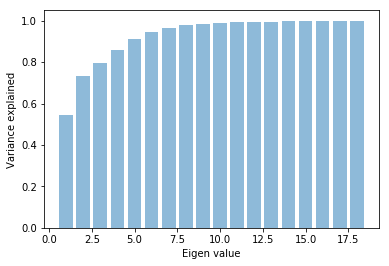

In [61]:
plt.bar(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_),alpha=0.5, align="center")
plt.ylabel("Variance explained")
plt.xlabel("Eigen value")
plt.show()

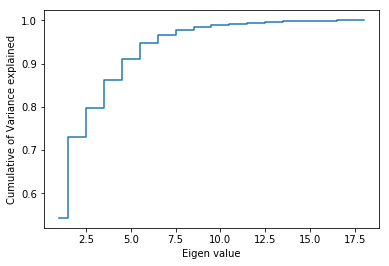

In [62]:
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_),where="mid")
plt.ylabel("Cumulative of Variance explained")
plt.xlabel("Eigen value")
plt.show()

<font color="blue">Dimentionality reduction</font>

In [63]:
pca2 = PCA(n_components=8)
pca2.fit(veh_df_std)
print("Eigen Values",pca2.explained_variance_)
print("Percentage of variance explained by each Eigen vectors:\n",pca2.explained_variance_ratio_)

Eigen Values [9.7929757  3.37710644 1.20873054 1.1365956  0.89628686 0.65829313
 0.32305653 0.22690661]
Percentage of variance explained by each Eigen vectors:
 [0.54338501 0.18738625 0.0670691  0.06306653 0.04973247 0.03652686
 0.01792551 0.01259042]


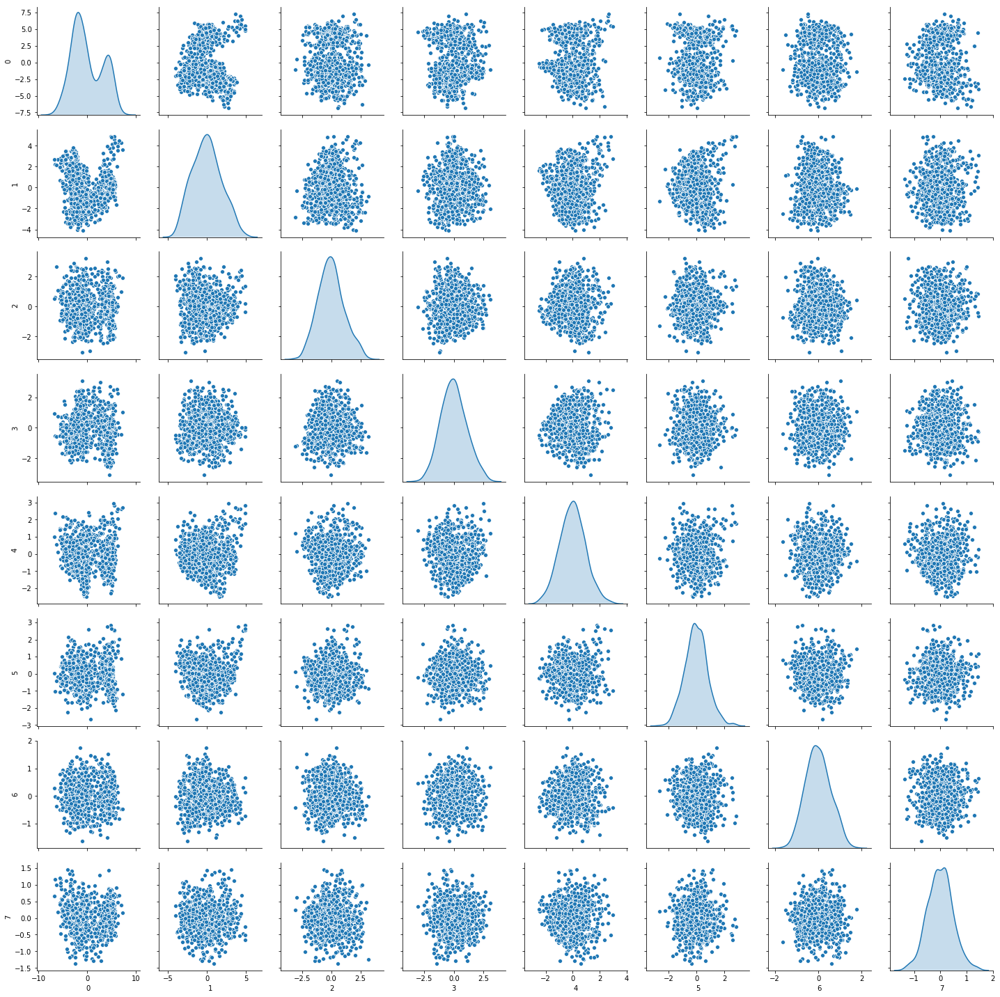

In [64]:
Xpca2 = pca2.transform(veh_df_std) 
sns.pairplot(pd.DataFrame(Xpca2),diag_kind='kde')

<h2><font color="blue">Iteration 2: creating and verifying models after performing PCA</font></h2>

In [65]:
#Spliting train and test data for the models
pca_X_train,pca_X_test,pca_y_train,pca_y_test = train_test_split(reduced_pca_veh_df,veh_df_dependent,test_size=0.30,random_state=1)

In [66]:
print(pca_X_train.shape,pca_X_test.shape,pca_y_train.shape,pca_y_test.shape)

(569, 8) (244, 8) (569,) (244,)


<font color="blue"><b>KNN - Afte PCA</b></font>

In [67]:
#Finding KNNscore for K value 1 to 20 - TO GET THE OPTIMUM K VALUE
for i in range(1,21):
    KNNscore,KNNpredict = do_KNN(pca_X_train,pca_X_test,pca_y_train,pca_y_test,i)# applying K values from 1 to 20
    print("When K value is "+str(i)+" score = "+str(KNNscore))

When K value is 1 score = 0.9139344262295082
When K value is 2 score = 0.8975409836065574
When K value is 3 score = 0.9426229508196722
When K value is 4 score = 0.930327868852459
When K value is 5 score = 0.9426229508196722
When K value is 6 score = 0.9262295081967213
When K value is 7 score = 0.9344262295081968
When K value is 8 score = 0.9221311475409836
When K value is 9 score = 0.9221311475409836
When K value is 10 score = 0.9262295081967213
When K value is 11 score = 0.9221311475409836
When K value is 12 score = 0.9180327868852459
When K value is 13 score = 0.9098360655737705
When K value is 14 score = 0.9180327868852459
When K value is 15 score = 0.9139344262295082
When K value is 16 score = 0.9180327868852459
When K value is 17 score = 0.9180327868852459
When K value is 18 score = 0.9139344262295082
When K value is 19 score = 0.9262295081967213
When K value is 20 score = 0.9180327868852459


The optimum K Value here is <font color="red">3</font> with 94.26

When K value is 3 score = 0.9426229508196722
Confusion matrix for KNN after PCA is


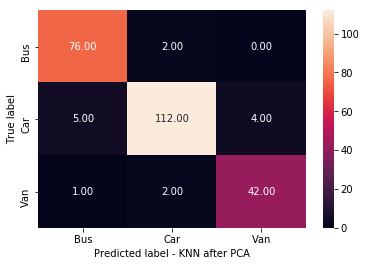

              precision    recall  f1-score   support

           0       0.93      0.97      0.95        78
           1       0.97      0.93      0.95       121
           2       0.91      0.93      0.92        45

   micro avg       0.94      0.94      0.94       244
   macro avg       0.94      0.94      0.94       244
weighted avg       0.94      0.94      0.94       244



In [68]:
# applying K value as 3 after PCA
optimum_kvalue = 3
pcaKNNscore,pcaKNNpredict = do_KNN(pca_X_train,pca_X_test,pca_y_train,pca_y_test,optimum_kvalue)
print("When K value is "+str(optimum_kvalue)+" score = "+str(pcaKNNscore))
print("Confusion matrix for KNN after PCA is")
conf_matrix= confusion_matrix(pca_y_test,pcaKNNpredict)
draw_conmmat(pca_y_test,pcaKNNpredict,"KNN after PCA")
print(classification_report(y_test, pcaKNNpredict))

In [69]:
pcaKNNf1score = f1_score(pca_y_test,pcaKNNpredict, average="weighted")
models_df.loc[len(models_df)] = [ "PCA-KNN",pcaKNNscore,pcaKNNf1score ]
models_df

,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572
2,Random Forest,0.963115,0.963115
3,SVM-c:0.01kernal:linear,0.938525,0.938831
4,SVM-c:0.05kernal:linear,0.967213,0.967216
5,SVM-c:0.5kernal:linear,0.950820,0.9507
6,SVM-c:1kernal:linear,0.950820,0.950767
7,SVM-c:0.01kernal:rbf,0.495902,0.32879
8,SVM-c:0.05kernal:rbf,0.495902,0.32879
9,SVM-c:0.5kernal:rbf,0.495902,0.32879


<font color="blue"><b>Naive Bayes - Afte PCA</b></font>

In [70]:
pcaNBscore, pcaNBpredicted_labels = do_naive_bayes(pca_X_train,pca_y_train,pca_X_test,pca_y_test)
print("Score in Naive Bayes after PCA : ",pcaNBscore)
modelscorecard["Naive Bayes  after PCA"]=pcaNBscore

print("Confusion matrix for Naive Bayes : ")
print(y_test.shape,"\n\n",pcaNBpredicted_labels.shape)
pcaNBf1score = f1_score(pca_y_test,pcaNBpredicted_labels, average="weighted")
models_df.loc[len(models_df)] = [ "PCA-Naive Bayes",pcaNBscore,pcaNBf1score ]
#con_matrix = confusion_matrix(y_test.tolist(), NBpredicted_labels.tolist())
models_df

Score in Naive Bayes after PCA :  0.8032786885245902
Confusion matrix for Naive Bayes : 
(244,) 

 (244,)


,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572
2,Random Forest,0.963115,0.963115
3,SVM-c:0.01kernal:linear,0.938525,0.938831
4,SVM-c:0.05kernal:linear,0.967213,0.967216
5,SVM-c:0.5kernal:linear,0.950820,0.9507
6,SVM-c:1kernal:linear,0.950820,0.950767
7,SVM-c:0.01kernal:rbf,0.495902,0.32879
8,SVM-c:0.05kernal:rbf,0.495902,0.32879
9,SVM-c:0.5kernal:rbf,0.495902,0.32879


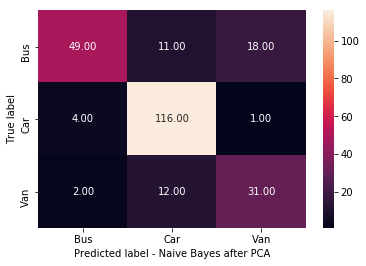

              precision    recall  f1-score   support

           0       0.89      0.63      0.74        78
           1       0.83      0.96      0.89       121
           2       0.62      0.69      0.65        45

   micro avg       0.80      0.80      0.80       244
   macro avg       0.78      0.76      0.76       244
weighted avg       0.81      0.80      0.80       244



In [71]:
draw_conmmat(pca_y_test,pcaNBpredicted_labels,"Naive Bayes after PCA")
print(classification_report(y_test, pcaNBpredicted_labels))

<font color="blue">K-Means after PCA</font> : though it is for Unlabled Unsupervised learning model, where we are dealing with labled classification problem, just wanted to test with K-Means

In [72]:
#reduced_pca,veh_df_dependent 
print(reduced_pca_veh_df.shape)
pcaveh_df_independent = np.array(reduced_pca_veh_df).astype(float)
#pcaveh_df_dependent = np.array(veh_df_dependent[0])
pcaveh_df_dependent = np.array(veh_dfkm.iloc[:,18])
# with Optimum K = 3
print(pcaveh_df_independent.shape,pcaveh_df_dependent.shape)
model = KMeans(3)
model.fit(pcaveh_df_independent)
prediction=model.predict(pcaveh_df_independent)
KMeansAccuracy =get_KMeans_accuracy(model,pcaveh_df_independent,pcaveh_df_dependent) 
print(KMeansAccuracy)

(813, 8)
(813, 8) (813,)
0.3198031980319803


<font color="blue"><b>Support Vector Machine - Afte PCA</b></font>

In [73]:
for i in range(0,len(kernals)):
    for j in range(0,len(cvals)):
        SVMscore,SVMPredict = do_SVM(pca_X_train,pca_X_test,pca_y_train,pca_y_test,cvals[j],kernals[i])
        SVMf1score = f1_score(pca_y_test,SVMPredict, average="weighted") #cannot use binary in multi class
        models_df.loc[len(models_df)] = [ "PCA-SVM-c:"+str(cvals[j])+"kernal:"+kernals[i],SVMscore,SVMf1score ]

/Users/thiru/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/thiru/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [74]:
models_df

,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572
2,Random Forest,0.963115,0.963115
3,SVM-c:0.01kernal:linear,0.938525,0.938831
4,SVM-c:0.05kernal:linear,0.967213,0.967216
5,SVM-c:0.5kernal:linear,0.950820,0.9507
6,SVM-c:1kernal:linear,0.950820,0.950767
7,SVM-c:0.01kernal:rbf,0.495902,0.32879
8,SVM-c:0.05kernal:rbf,0.495902,0.32879
9,SVM-c:0.5kernal:rbf,0.495902,0.32879


<font color="blue">Observations: Support Vector model, after Principal Component Analysis (PCA-SVM-c:1kernal:rbf)with all 8 features is predicting with accuracy <font color="red">95.90%</font>with f1score 95.88</font> 
<img src="./modelcomp2.png" alt="Model Compare image" height="900" width="400"></img>

In [75]:
#Calculating with optimum C value and 'rbf' kernal to get confusion matrix and other metrics
SVMscore,SVMPredict = do_SVM(pca_X_train,pca_X_test,pca_y_train,pca_y_test,1,"rbf")
print("Score in Support Vector Classifier : ",SVMscore)
modelscorecard["Support Vector Classifier"]=SVMscore

SVMf1score = f1_score(y_test,RFpredicted_labels, average="weighted")
print(y_test.shape,"\n\n",SVMPredict.shape)


Score in Support Vector Classifier :  0.9590163934426229
(244,) 

 (244,)


Score in Support Vector Classifier :  0.9590163934426229
Confusion matrix for Support Vector Classifier : 


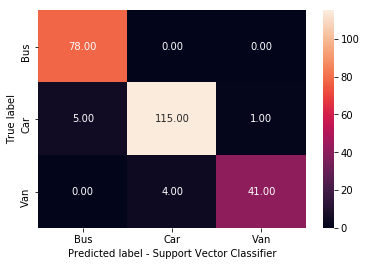

              precision    recall  f1-score   support

           0       0.94      1.00      0.97        78
           1       0.97      0.95      0.96       121
           2       0.98      0.91      0.94        45

   micro avg       0.96      0.96      0.96       244
   macro avg       0.96      0.95      0.96       244
weighted avg       0.96      0.96      0.96       244



In [76]:
print("Score in Support Vector Classifier : ",SVMscore)
print("Confusion matrix for Support Vector Classifier : ")
draw_conmmat(y_test,SVMPredict,"Support Vector Classifier")
print(classification_report(y_test, SVMPredict))

<font color="blue"><b>Random Forest - After PCA</b></font>

In [77]:
pca_RFscore, pca_RFpredicted_labels = do_randomforest(pca_X_train,pca_y_train,pca_X_test,pca_y_test)
print("Score in Random Forest aftre PCA : ",pca_RFscore)

pca_RFf1score = f1_score(pca_y_test,pca_RFpredicted_labels, average="weighted") #cannot use binary
models_df.loc[len(models_df)] = [ "PCARandom Forest",pca_RFscore,pca_RFf1score ]
print(y_test.shape,"\n\n",pca_RFpredicted_labels.shape)
models_df

Score in Random Forest aftre PCA :  0.8729508196721312
(244,) 

 (244,)


,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572
2,Random Forest,0.963115,0.963115
3,SVM-c:0.01kernal:linear,0.938525,0.938831
4,SVM-c:0.05kernal:linear,0.967213,0.967216
5,SVM-c:0.5kernal:linear,0.950820,0.9507
6,SVM-c:1kernal:linear,0.950820,0.950767
7,SVM-c:0.01kernal:rbf,0.495902,0.32879
8,SVM-c:0.05kernal:rbf,0.495902,0.32879
9,SVM-c:0.5kernal:rbf,0.495902,0.32879


Confusion matrix for Random Forest after PCA: 


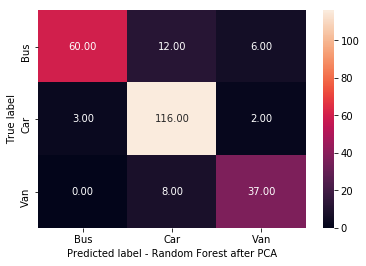

              precision    recall  f1-score   support

           0       0.95      0.77      0.85        78
           1       0.85      0.96      0.90       121
           2       0.82      0.82      0.82        45

   micro avg       0.87      0.87      0.87       244
   macro avg       0.88      0.85      0.86       244
weighted avg       0.88      0.87      0.87       244



In [78]:
print("Confusion matrix for Random Forest after PCA: ")
draw_conmmat(pca_y_test,pca_RFpredicted_labels,"Random Forest after PCA")
print(classification_report(pca_y_test, pca_RFpredicted_labels))

In [79]:
models_df

,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572
2,Random Forest,0.963115,0.963115
3,SVM-c:0.01kernal:linear,0.938525,0.938831
4,SVM-c:0.05kernal:linear,0.967213,0.967216
5,SVM-c:0.5kernal:linear,0.950820,0.9507
6,SVM-c:1kernal:linear,0.950820,0.950767
7,SVM-c:0.01kernal:rbf,0.495902,0.32879
8,SVM-c:0.05kernal:rbf,0.495902,0.32879
9,SVM-c:0.5kernal:rbf,0.495902,0.32879


<h2><font color="#07bdf5">6.Model Comparison</font></h2><br>
<font color="blue">Comparing  the results </font>

In [80]:
models_df

,Model,Accuracy,F1Score
0,KNN,0.885246,0.885177
1,Naive Bayes,0.581967,0.579572
2,Random Forest,0.963115,0.963115
3,SVM-c:0.01kernal:linear,0.938525,0.938831
4,SVM-c:0.05kernal:linear,0.967213,0.967216
5,SVM-c:0.5kernal:linear,0.950820,0.9507
6,SVM-c:1kernal:linear,0.950820,0.950767
7,SVM-c:0.01kernal:rbf,0.495902,0.32879
8,SVM-c:0.05kernal:rbf,0.495902,0.32879
9,SVM-c:0.5kernal:rbf,0.495902,0.32879


<font color="blue">Hyper parameter tuning for the best model Support Vector Classifier</font>

In [81]:
def classifiers_hypertune(name,rf,param_grid,x_train_scaled,y_train,x_test_scaled,y_test,CV):
    CV_rf = GridSearchCV(estimator=rf, param_grid=param_grid, cv=CV, verbose= 1, n_jobs =-1 )
    CV_rf.fit(x_train_scaled, y_train)
    
    y_pred_train = CV_rf.predict(x_train_scaled)
    y_pred_test = CV_rf.predict(x_test_scaled)
    
    print('Best Score: ', CV_rf.best_score_)
    print('Best Params: ', CV_rf.best_params_)
    
    
    
    #Classification Report
    print(name+" Classification Report: ")
    print(classification_report(y_test, y_pred_test))
    
   
    #Confusion Matrix for test data
    draw_conmmat(y_test,y_pred_test,"SVM Original Dataset")
    print("SVM Accuracy Score",classification_report(pca_y_test, pca_RFpredicted_labels))

In [82]:
#Training on SVM Classifier
from sklearn.model_selection import GridSearchCV
svmc = svm.SVC()
#Let's See What all parameters one can tweak 
print("SVM Parameters:", svmc.get_params())
# Create the parameter grid based on the results of random search 
param_grid = [
  {'C': [0.01, 0.05, 0.5, 1], 'kernel': ['linear']},
  {'C': [0.01, 0.05, 0.5, 1],  'kernel': ['rbf']},
 ]
param_grid_1 = [
  {'C': [1, 10, 100, 1000], 'kernel': ['linear']},
  {'C': [1, 10, 100, 1000], 'gamma': [0.001, 0.0001], 'kernel': ['rbf']},
 ]

SVM Parameters: {'C': 1.0, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'auto_deprecated', 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}


Fitting 10 folds for each of 8 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  73 out of  80 | elapsed:    4.6s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    4.7s finished
/Users/thiru/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Best Score:  0.9543057996485061
Best Params:  {'C': 0.05, 'kernel': 'linear'}
Support Vector Classifier Classification Report: 
              precision    recall  f1-score   support

           0       0.95      0.97      0.96        78
           1       0.97      0.98      0.97       121
           2       1.00      0.93      0.97        45

   micro avg       0.97      0.97      0.97       244
   macro avg       0.97      0.96      0.97       244
weighted avg       0.97      0.97      0.97       244



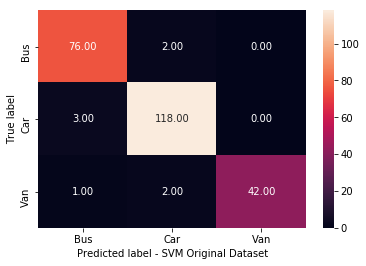

SVM Accuracy Score               precision    recall  f1-score   support

           0       0.95      0.77      0.85        78
           1       0.85      0.96      0.90       121
           2       0.82      0.82      0.82        45

   micro avg       0.87      0.87      0.87       244
   macro avg       0.88      0.85      0.86       244
weighted avg       0.88      0.87      0.87       244



In [83]:
classifiers_hypertune("Support Vector Classifier", svmc, param_grid,X_train, y_train, X_test, y_test,10)

Fitting 10 folds for each of 8 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Best Score:  0.9472759226713533
Best Params:  {'C': 1, 'kernel': 'rbf'}
Support Vector Classifier After PCA Classification Report: 
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        78
           1       0.97      0.98      0.97       121
           2       0.98      0.89      0.93        45

   micro avg       0.97      0.97      0.97       244
   macro avg       0.97      0.95      0.96       244
weighted avg       0.97      0.97      0.97       244



[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    0.6s finished
/Users/thiru/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/Users/thiru/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


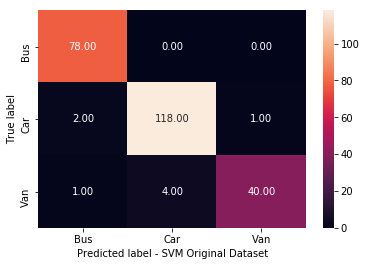

SVM Accuracy Score               precision    recall  f1-score   support

           0       0.95      0.77      0.85        78
           1       0.85      0.96      0.90       121
           2       0.82      0.82      0.82        45

   micro avg       0.87      0.87      0.87       244
   macro avg       0.88      0.85      0.86       244
weighted avg       0.88      0.87      0.87       244



In [84]:
classifiers_hypertune("Support Vector Classifier After PCA", svmc, param_grid,pca_X_train, pca_y_train, pca_X_test, pca_y_test,10)

<font color="blue">
We have considered Accuracy and also F1 score  - as the dataset is more <font color="red">biased towards Not subscribed Term Deposit observations</font><br></font><br>
F1 = 2 * (precision * recall) / (precision + recall)

<font color="blue"><h2>Conclusion:</h2></font>

Model score report with Accuracy and F1 score shows the precision, recall, F1 and support scores for all the classification model we have tried.

Best score we have achieved through:<br>
<font color="blue">Model: </font><font color="red">Support Vector Machine</font><font color="blue"> with parameters c = <font color="red">0.05</font> and Kernal=<font color="red">linear</font></font><br>
<font color="blue">Accuracy:</font><font color="red">	96.72%</font><br>
<font color="blue">F1 Score:</font><font color="red">	96.72%</font><br>
<font color="blue">Number of Features</font><font color="red">	18</font><br>

The best model is : <br>
<p>Support Vector Machine classifier with <font color="red">18</font> independent attributes 96.72% parameters used C value = 0.05 and Kernal="linear"</p><br>

<font color="blue">Model after <u>PCA</u>: </font><font color="red">Support Vector Machine</font><font color="blue"> with parameters c = <font color="red">1</font> and Kernal=<font color="red">rbf</font></font><br>
<font color="blue">Accuracy:</font><font color="red">	95.90%</font><br>
<font color="blue">F1 Score:</font><font color="red">	95.88%</font><br>
<font color="blue">Number of features</font><font color="red">	8</font><br>

<p>Almost the similar accuracy is possible with 8 features after PCA, as described below. Which will reduce compute power and other resources required while the model is scalled to production with large amount of data.</p><br>

<p>Support Vector Machine classifier after PCA dimensionality reduction, <font color="red">8</font> independent attributes that predicts with accuracy 95.90% and F1 score 95.88% : the parameters used for SVM are C value = 1 and Kernal="rbf"</p>

<p><font color="blue">Random Forest</font> with all 18 features with high linear relationship among features predicts with accuray <font color="red">96.31%</font>, however after PCA with 8 independent features Random forest accuracy is drastically reduced with <font color="red">87.29%</font> with F1Score 87.13%

<font color="blue"></font> 
<br>
<br>